In [1]:
import scimap as sm
import numpy as np
import anndata as ad
import pandas as pd
import scanpy as sc
import scipy as sp
import os
import sys
import yaml
from pathlib import Path
from collections import OrderedDict
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import rcParams
from matplotlib import colormaps
from matplotlib.lines import Line2D
import seaborn as sns
from scipy.ndimage import gaussian_filter, binary_fill_holes, distance_transform_edt
from skimage import measure, morphology
from skimage.filters import threshold_otsu
from skimage.segmentation import find_boundaries
from shapely.geometry import Polygon
from shapely.geometry import Point
sys.path.append(os.path.abspath(".."))
rcParams['font.family'] = 'Arial'
from utils import extract_all_tumor_cores_otsu, extract_interaction

Running SCIMAP  2.2.11


/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/mpl_scatter_density/__init__.py:4: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [2]:
with open("../config.yaml", "r") as f:
    config = yaml.safe_load(f)

# Set up directories
results_dir = Path(config['results_dir'])
metadata_dir = Path(config['metadata_dir'])

In [3]:
# Load both adata and adata_unified 
adata = ad.read(results_dir / 'adata.h5ad')
adata_unified = ad.read(results_dir / "adata_unified.h5ad")

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning:

`anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.

/Users/jawadalaaedeen/Desktop/PhD/NMC/NMC_spatial/spatial_analysis/nmc_spatial_env/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning:

`anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.



In [5]:
##get the color scheme
conditions = [
    adata.obs['cell_type'] == 'CD4+_T_cells',
    adata.obs['cell_type'] == 'CD8+_T_cells',
    adata.obs['cell_type'] == "Treg_T_cells",
    adata.obs['cell_type'] == 'NK_cells',
    adata.obs['cell_type'] == "M1_macrophages",
    adata.obs['cell_type'] == "M2_macrophages",
    adata.obs['cell_type'] == "M1_M2_macrophages",
    adata.obs['cell_type'] == "B_cells",
    adata.obs['cell_type'] == 'Plasma_cells',
    adata.obs['cell_type'] == 'DCs',
    adata.obs['cell_type'] == 'Granulocytes',
    adata.obs['cell_type'] == 'Mast_cells',
    adata.obs['cell_type'] == 'MDSCs',
    adata.obs['cell_type'] == 'Lymphatic_endothelial_cells',
    adata.obs['cell_type'] == 'Endothelial_cells',
    adata.obs['cell_type'] == 'Actin+_cells',
    adata.obs['cell_type'] == 'Tumor_cells',
    adata.obs['cell_type'] == 'Epithelial_cells',
    adata.obs['cell_type'] == 'NFC'
]

# Define the corresponding labels
labels = [
    'CD4+ T cells',
    'CD8+ T cells',
    'Treg cells',
    'NK cells',
    'M1 macrophages',
    'M2 macrophages',
    'M1/M2 macrophages',
    'B cells',
    'PCs',
    'DCs',
    'Granulocytes',
    'Mast cells',
    'MDSCs',
    'Lymphatic endothelial cells',
    'Endothelial cells',
    'Actin+ cells',
    'Tumor cells',
    'Epithelial cells',
    'NFC'
]

#using np.select
adata.obs['cell_category'] = np.select(conditions, labels, default='Other')

# now for adata_unified 
conditions = [
    adata_unified.obs['cell_type'] == 'CD4+_T_cells',
    adata_unified.obs['cell_type'] == 'CD8+_T_cells',
    adata_unified.obs['cell_type'] == "Treg_T_cells",
    adata_unified.obs['cell_type'] == 'NK_cells',
    adata_unified.obs['cell_type'] == "M1_macrophages",
    adata_unified.obs['cell_type'] == "M2_macrophages",
    adata_unified.obs['cell_type'] == "M1_M2_macrophages",
    adata_unified.obs['cell_type'] == "B_cells",
    adata_unified.obs['cell_type'] == 'Plasma_cells',
    adata_unified.obs['cell_type'] == 'DCs',
    adata_unified.obs['cell_type'] == 'Granulocytes',
    adata_unified.obs['cell_type'] == 'Mast_cells',
    adata_unified.obs['cell_type'] == 'MDSCs',
    adata_unified.obs['cell_type'] == 'Lymphatic_endothelial_cells',
    adata_unified.obs['cell_type'] == 'Endothelial_cells',
    adata_unified.obs['cell_type'] == 'Actin+_cells',
    adata_unified.obs['cell_type'] == 'Tumor_cells',
    adata_unified.obs['cell_type'] == 'Epithelial_cells',
    adata_unified.obs['cell_type'] == 'NFC'
]

adata_unified.obs['cell_category'] = np.select(conditions, labels, default='Other')



cell_category_color = {
    "Actin+ cells": "#AAAAFF",
    "B cells": "#FFFF00",
    "DCs": "#00FF00",
    "Endothelial cells": "#55FFFF",
    "Granulocytes": "#FF00FF",
    "Lymphatic endothelial cells": "#0055FF",
    "Mast cells": "#AA007F",
    "MDSCs": "#00007F",
    "NFC": "#A9A9A9",
    "NK cells": "#00AAFF",
    "PCs": "#FFFF7F",
    "CD4+ T cells": "#0055FF",
    "CD8+ T cells": "#FF0000",
    "Treg cells": "#AAFF7F",
    "Tumor cells": "#555555",
    "Epithelial cells": "#FFCC99",
    "M1 macrophages": "#00557F",
    "M2 macrophages": "#00AA7F",
    "M1/M2 macrophages": "#007F7F",
}

myeloid_color = {
    "DCs": "#00FF00",
    "Granulocytes": "#FF00FF",
    "Mast cells": "#AA007F",
    "MDSCs": "#00007F",
    "M1 macrophages": "#00557F",
    "M2 macrophages": "#00AA7F",
    "M1/M2 macrophages": "#007F7F",
}

lymphoid_color = {
    "B cells": "#FFFF00",
    "NK cells": "#00AAFF",
    "PCs": "#FFFF7F",
    "Treg cells": "#AAFF7F",
    "CD4+ T cells": "#0055FF",
    "CD8+ T cells": "#FF0000",  
}

#all cell types order
all_ct_order = ["Treg cells", "CD8+ T cells", "CD4+ T cells", "NK cells",  "PCs", "B cells", "DCs", 
                "Mast cells", "Granulocytes", "M1/M2 macrophages", "M1 macrophages", "M2 macrophages",  
                "MDSCs", "Lymphatic endothelial cells", "Endothelial cells", "Epithelial cells", "NFC", "Actin+ cells", "Tumor cells"]
lymphoid_order = ["Treg cells", "CD8+ T cells", "CD4+ T cells", "NK cells",  "PCs", "B cells"]
myeloid_order = ["DCs", "Mast cells", "Granulocytes", "M1/M2 macrophages", "M1 macrophages", "M2 macrophages",  "MDSCs"]

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/598237597.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



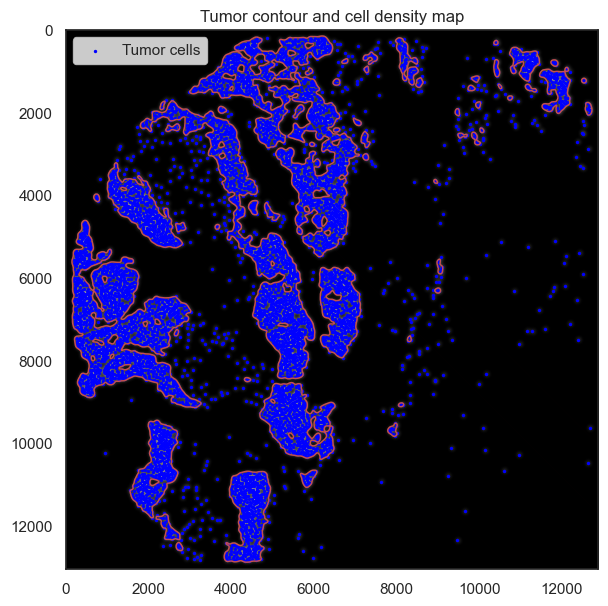

In [8]:
adata_select = adata[adata.obs['patient_exp'] == "NMC_7_ROI13"]
# --- Parameters ---
PIXEL_SIZE_UM = 0.17     # MACSIMA resolution
SMOOTH_SIGMA_PX = 50     # Gaussian smoothing for contour (≈ 8.5 µm)
THRESHOLD_REL = 0.2      # Relative threshold for density map (20% of max)
MIN_OBJECT_SIZE = 5000    # min area to keep (in pixels)
CLOSE_RADIUS = 5          # morphological closing radius (in pixels)

# --- 1. Extract tumor coordinates ---
tumor_cells = adata_select.obs[adata.obs['cell_type'] == 'Tumor_cells']
x = tumor_cells['Cell Center X'].values
y = tumor_cells['Cell Center Y'].values

# --- 2. Define image canvas (we’ll base it on data extents) ---
pad = 200  # pixels of padding around edges
x_min, x_max = x.min() - pad, x.max() + pad
y_min, y_max = y.min() - pad, y.max() + pad
W = int(np.ceil(x_max - x_min))
H = int(np.ceil(y_max - y_min))

# --- 3. Create a density image ---
density = np.zeros((H, W), dtype=np.float32)
x_int = np.round(x - x_min).astype(int)
y_int = np.round(y - y_min).astype(int)
valid = (x_int >= 0) & (x_int < W) & (y_int >= 0) & (y_int < H)
density[y_int[valid], x_int[valid]] += 1

# Smooth the density to create a continuous "heat map"
density_smooth = gaussian_filter(density, sigma=SMOOTH_SIGMA_PX)

# --- 4. Threshold to create a binary tumor region ---
thr = THRESHOLD_REL * density_smooth.max()
tumor_mask = density_smooth > thr

# --- 5. Clean the mask (remove holes, smooth edges) ---
tumor_mask = morphology.remove_small_objects(tumor_mask, MIN_OBJECT_SIZE)
tumor_mask = morphology.remove_small_holes(tumor_mask, area_threshold=MIN_OBJECT_SIZE)
tumor_mask = morphology.binary_closing(tumor_mask, morphology.disk(CLOSE_RADIUS))

# --- 6. Extract contour coordinates for visualization ---
contours = measure.find_contours(tumor_mask, 0.5)
# Usually one big contour; if multiple, you can choose the largest one
contours = [c for c in contours if len(c) > 100]
if len(contours) > 1:
    largest = max(contours, key=lambda c: len(c))
else:
    largest = contours[0]
contour_coords = np.fliplr(largest)  # (x,y) order

# --- 7. Compute signed distance map ---
# Distance to nearest tumor pixel, in µm
dist_out_px = distance_transform_edt(~tumor_mask)
dist_in_px  = distance_transform_edt(tumor_mask)
signed_dist_um = dist_out_px.astype(float)
signed_dist_um[tumor_mask] = -dist_in_px[tumor_mask]
signed_dist_um *= PIXEL_SIZE_UM  # convert to µm

# --- 8. Quantify distance for each cell (all cell types) ---
# Convert coordinates to local indices (relative to x_min, y_min)
x_all = adata.obs['Cell Center X'].values
y_all = adata.obs['Cell Center Y'].values
x_idx = np.clip(np.round(x_all - x_min).astype(int), 0, W-1)
y_idx = np.clip(np.round(y_all - y_min).astype(int), 0, H-1)

cell_dist_um = signed_dist_um[y_idx, x_idx]
#adata.obs['dist_to_tumor_um'] = cell_dist_um

# --- 9. Visualize ---
plt.figure(figsize=(7,7))
plt.imshow(density_smooth, cmap='gray')
plt.contour(tumor_mask, colors='r', linewidths=1)
plt.scatter(x - x_min, y - y_min, s=2, c='blue', label='Tumor cells')
plt.title('Tumor contour and cell density map')
plt.legend()
plt.show()


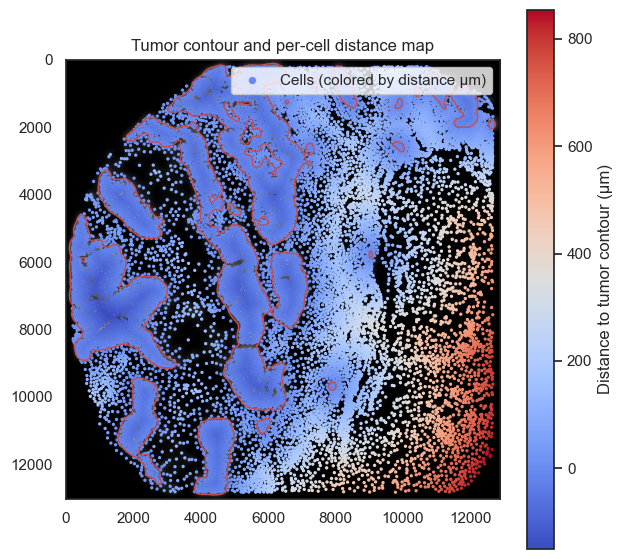

In [22]:
# --- Parameters ---
PIXEL_SIZE_UM = 0.17     # MACSIMA resolution
SMOOTH_SIGMA_PX = 100     # Gaussian smoothing for contour (≈ 8.5 µm)
THRESHOLD_REL = 0.2      # Relative threshold for density map (20% of max)
MIN_OBJECT_SIZE = 5000   # min area to keep (in pixels)
CLOSE_RADIUS = 5         # morphological closing radius (in pixels)

# --- 1. Extract tumor coordinates ---
tumor_cells = adata_select.obs[adata_select.obs['cell_type'] == 'Tumor_cells']
x_tumor = tumor_cells['Cell Center X'].values
y_tumor = tumor_cells['Cell Center Y'].values

# --- 2. Define image canvas based on *all cells in ROI* ---
x_all = adata_select.obs['Cell Center X'].values
y_all = adata_select.obs['Cell Center Y'].values

pad = 200  # pixels of padding
x_min, x_max = x_all.min() - pad, x_all.max() + pad
y_min, y_max = y_all.min() - pad, y_all.max() + pad
W = int(np.ceil(x_max - x_min))
H = int(np.ceil(y_max - y_min))

# --- 3. Create tumor-cell density map ---
density = np.zeros((H, W), dtype=np.float32)
x_int = np.round(x_tumor - x_min).astype(int)
y_int = np.round(y_tumor - y_min).astype(int)
valid = (x_int >= 0) & (x_int < W) & (y_int >= 0) & (y_int < H)
density[y_int[valid], x_int[valid]] += 1

# Smooth to create continuous density
density_smooth = gaussian_filter(density, sigma=SMOOTH_SIGMA_PX)

# --- 4. Threshold to make tumor mask ---
thr = THRESHOLD_REL * density_smooth.max()
tumor_mask = density_smooth > thr

# --- 5. Clean mask ---
tumor_mask = morphology.remove_small_objects(tumor_mask, MIN_OBJECT_SIZE)
tumor_mask = morphology.remove_small_holes(tumor_mask, area_threshold=MIN_OBJECT_SIZE)
tumor_mask = morphology.binary_closing(tumor_mask, morphology.disk(CLOSE_RADIUS))

# --- 6. Extract contour coordinates ---
contours = measure.find_contours(tumor_mask, 0.5)
contours = [c for c in contours if len(c) > 100]
if len(contours) > 1:
    largest = max(contours, key=lambda c: len(c))
else:
    largest = contours[0]
contour_coords = np.fliplr(largest)  # to (x,y)

# --- 7. Compute signed distance map (µm) ---
dist_out_px = distance_transform_edt(~tumor_mask)
dist_in_px  = distance_transform_edt(tumor_mask)
signed_dist_um = dist_out_px.astype(float)
signed_dist_um[tumor_mask] = -dist_in_px[tumor_mask]
signed_dist_um *= PIXEL_SIZE_UM  # convert to µm

# --- 8. Quantify distance for each cell (all cell types in ROI) ---
x_idx = np.clip(np.round(x_all - x_min).astype(int), 0, W-1)
y_idx = np.clip(np.round(y_all - y_min).astype(int), 0, H-1)
cell_dist_um = signed_dist_um[y_idx, x_idx]

adata_select.obs['dist_to_tumor_um'] = cell_dist_um

# --- 9. Define compartments based on distance ---
adata_select.obs['compartment'] = np.select(
    [
        adata_select.obs['dist_to_tumor_um'] == 0,                           # inside deep (core)
        (adata_select.obs['dist_to_tumor_um'] > 0) & (adata_select.obs['dist_to_tumor_um'] < 50),  # near edge
        adata_select.obs['dist_to_tumor_um'] >= 50                               # outside
    ],
    ['Tumor_core', 'Tumor_margin', 'Outside_tumor']
)

# --- 10. Visualization ---
plt.figure(figsize=(7,7))
plt.imshow(density_smooth, cmap='gray')
plt.contour(tumor_mask, colors='r', linewidths=1)
plt.scatter(
    adata_select.obs['Cell Center X'] - x_min,
    adata_select.obs['Cell Center Y'] - y_min,
    s=2,
    c=adata_select.obs['dist_to_tumor_um'],
    cmap='coolwarm',
    label='Cells (colored by distance µm)'
)
plt.title('Tumor contour and per-cell distance map')
plt.colorbar(label='Distance to tumor contour (µm)')
plt.legend(loc='upper right', markerscale=3)
plt.show()


In [25]:
np.min(adata_select.obs.dist_to_tumor_um), np.max(adata_select.obs.dist_to_tumor_um)

(-150.63208755109252, 854.0467031726076)

/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/1999366815.py:1: FutureWarning:

Use `squidpy.pl.spatial_scatter` instead.



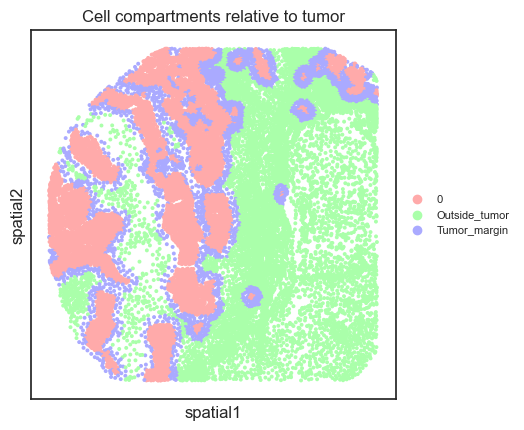

In [23]:
sc.pl.spatial(
    adata_select,
    color='compartment',
    size=1.5,
    spot_size=100,
    palette=['#FFAAAA', '#AAFFAA', '#AAAAFF'],
    title='Cell compartments relative to tumor',
    legend_fontsize=8
)

Processing experiment: NMC_14_ROI11


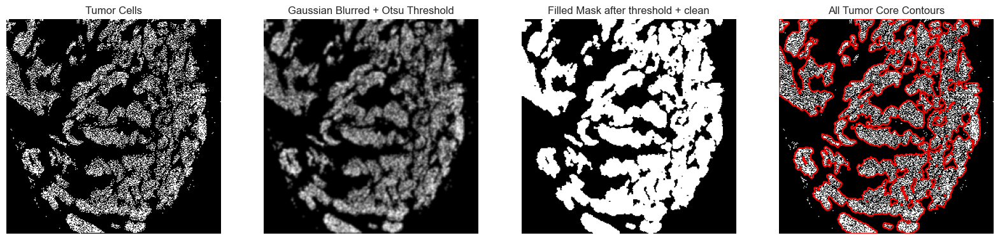

Not saving figure.
Processing experiment: NMC_15_ROI16


/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/442507357.py:12: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[True, True, True, True, True, True, True, False, True, True, True, False, False, False, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, True, True, False, False, False, True, True, True, True, True, True, True, False, False, False, False, True, True, True, True, False, True, False, False, False, True, True, False, True, True, True, True, True, True, True, False, False, True, True, True, True, False, True, True, False, True, True, True, False, False, True, False, True, True, True, False, True, False, Tr

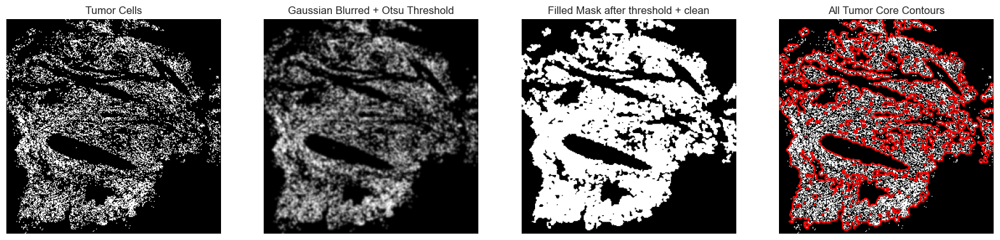

Not saving figure.
Processing experiment: NMC_15_ROI7


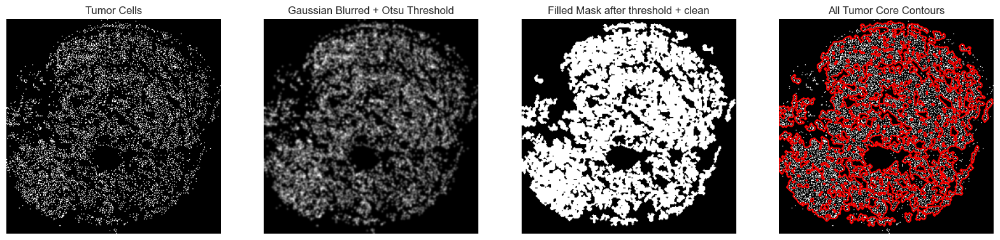

Not saving figure.
Processing experiment: NMC_1_ROI3


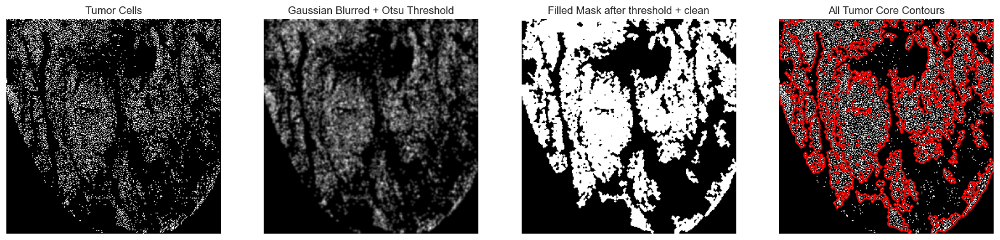

Not saving figure.
Processing experiment: NMC_16_ROI19


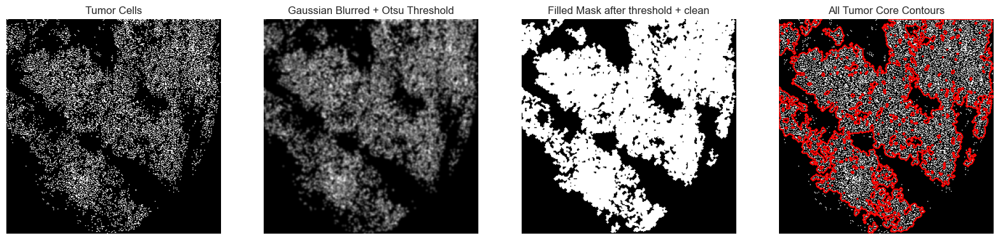

Not saving figure.
Processing experiment: NMC_2_ROI1


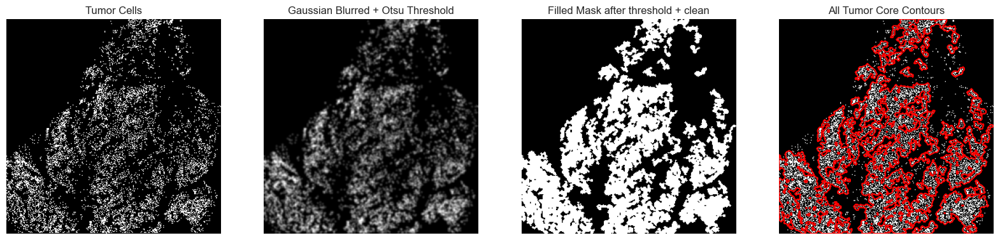

Not saving figure.
Processing experiment: NMC_14_ROI8


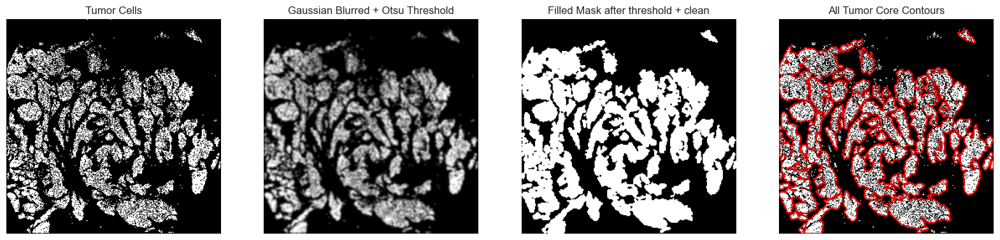

Not saving figure.
Processing experiment: NMC_16_ROI17


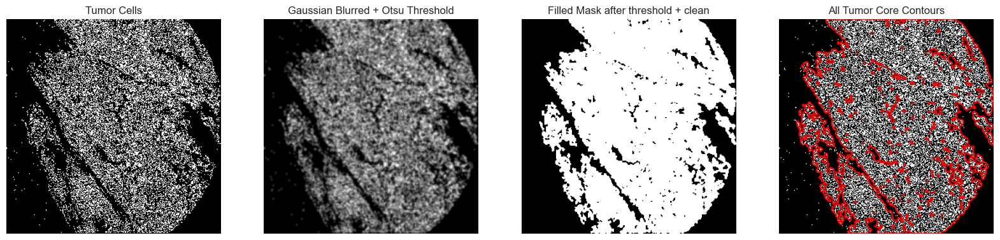

Not saving figure.
Processing experiment: NMC_5_ROI10


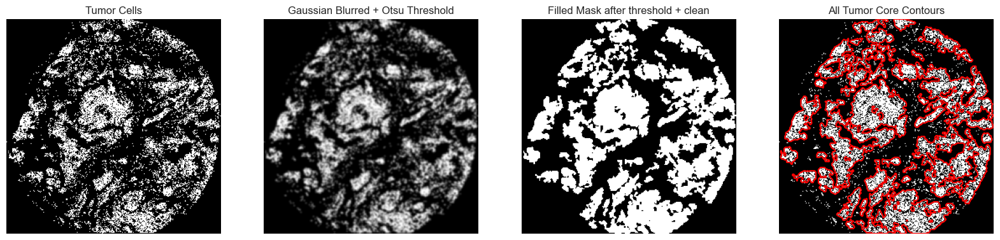

Not saving figure.
Processing experiment: NMC_8_ROI17


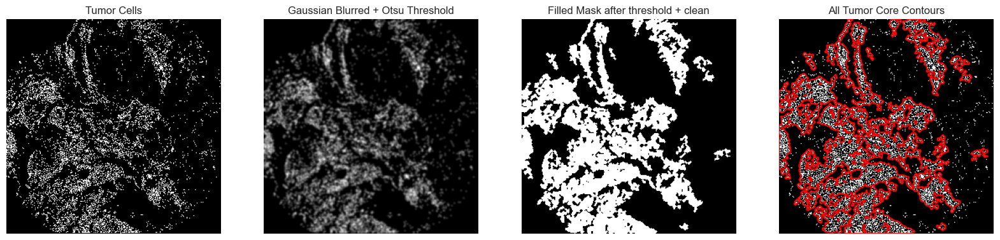

Not saving figure.
Processing experiment: NMC_5_ROI11


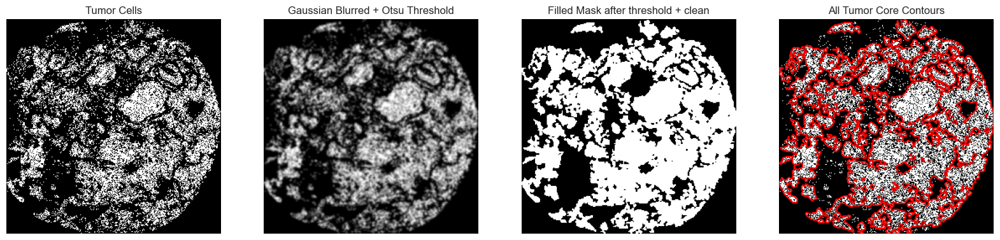

Not saving figure.
Processing experiment: NMC_6_ROI5


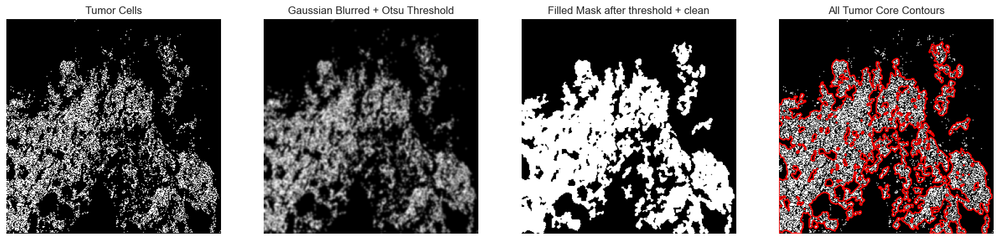

Not saving figure.
Processing experiment: NMC_12_ROI5


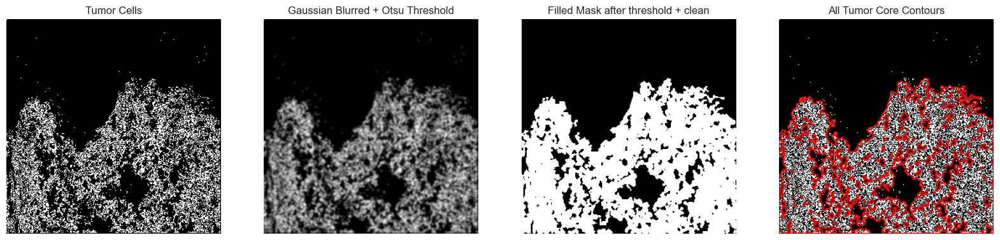

Not saving figure.
Processing experiment: NMC_13_ROI15


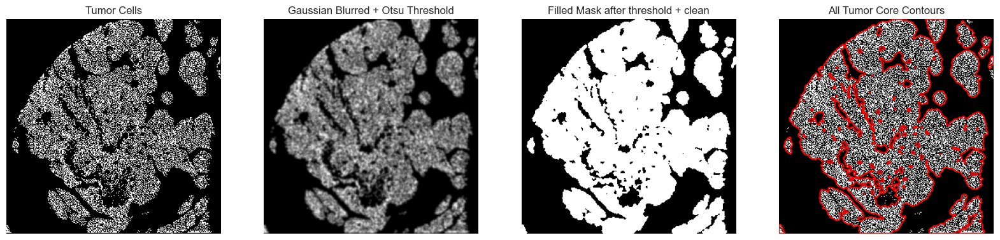

Not saving figure.
Processing experiment: NMC_1_ROI1


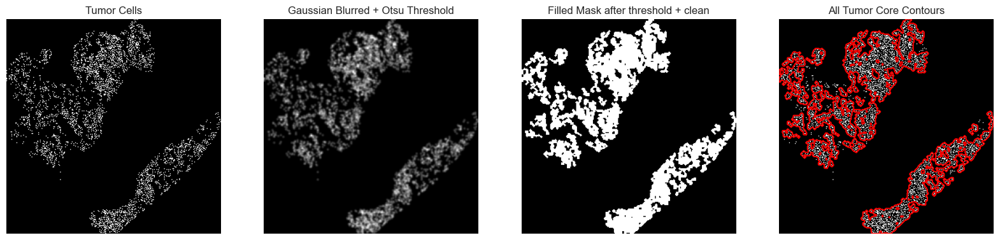

Not saving figure.
Processing experiment: NMC_9_ROI4


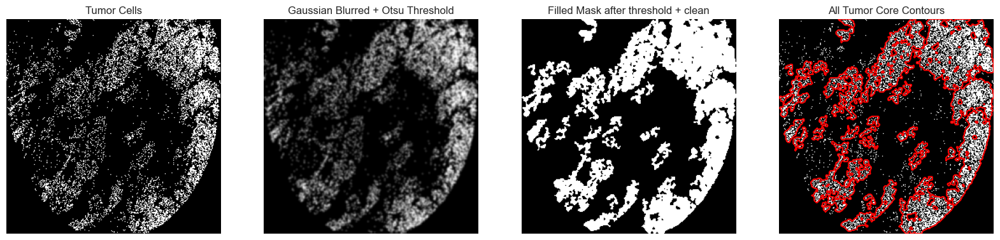

Not saving figure.
Processing experiment: NMC_21_ROI23


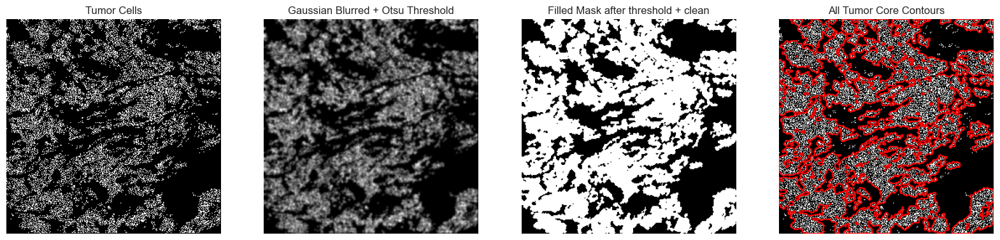

Not saving figure.
Processing experiment: NMC_9_ROI3


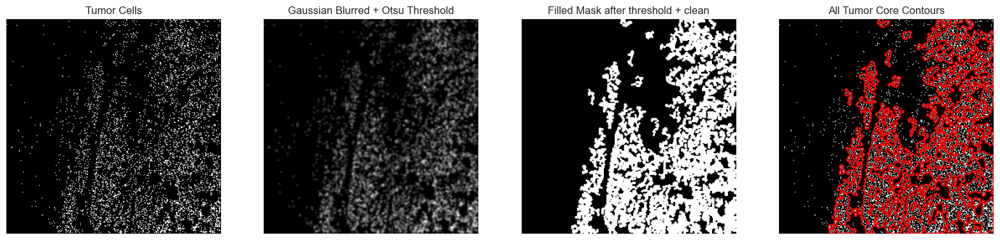

Not saving figure.
Processing experiment: NMC_4_ROI9


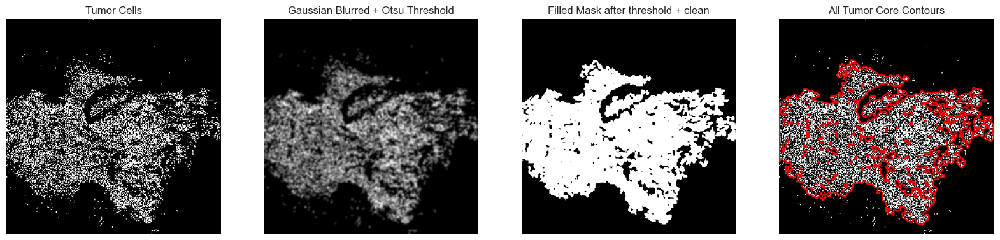

Not saving figure.
Processing experiment: NMC_13_ROI14


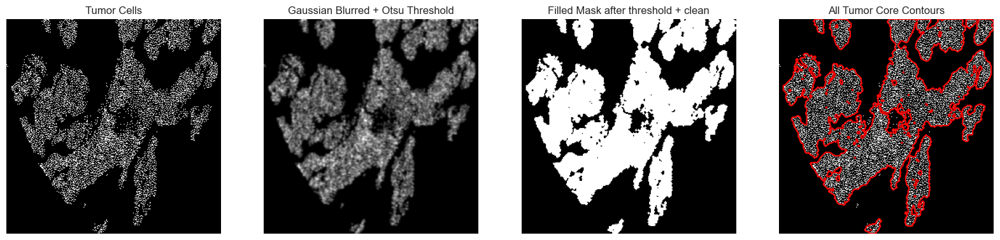

Not saving figure.
Processing experiment: NMC_7_ROI14


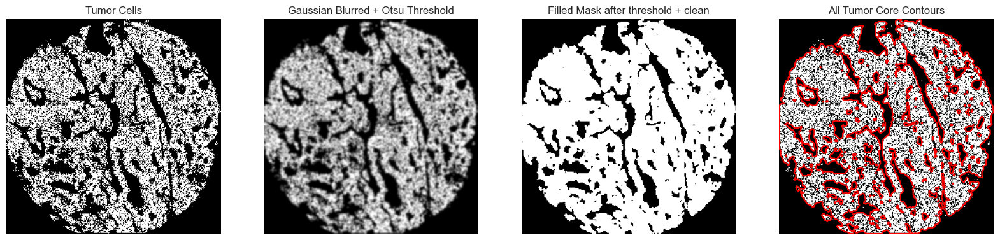

Not saving figure.
Processing experiment: NMC_7_ROI13


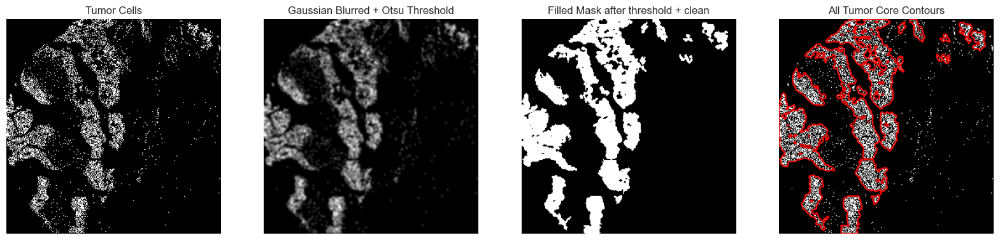

Not saving figure.
Processing experiment: NMC_6_ROI6


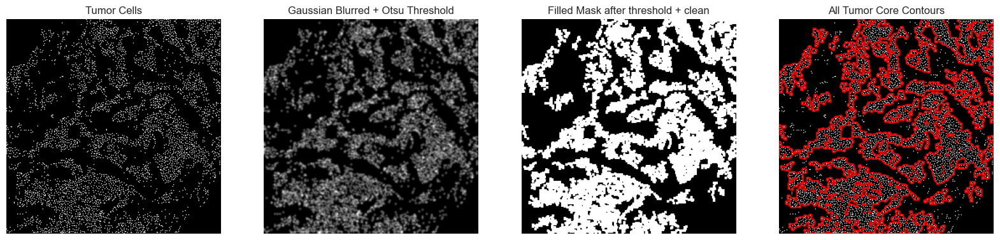

Not saving figure.
Processing experiment: NMC_12_ROI6


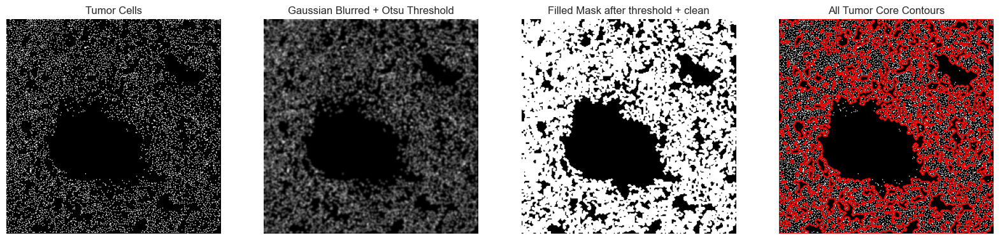

Not saving figure.
Processing experiment: NMC_14_ROI11


/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/442507357.py:14: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



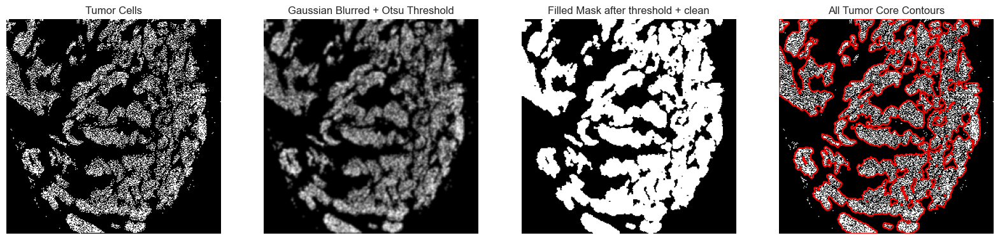

Not saving figure.
Processing experiment: NMC_15_ROI16


/var/folders/zj/m3tnl76s7d5894m0ndctg1kh0000gn/T/ipykernel_10625/442507357.py:25: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[True, True, True, True, True, True, True, False, True, True, True, False, False, False, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, True, True, False, False, False, True, True, True, True, True, True, True, False, False, False, False, True, True, True, True, False, True, False, False, False, True, True, False, True, True, True, True, True, True, True, False, False, True, True, True, True, False, True, True, False, True, True, True, False, False, True, False, True, True, True, False, True, False, Tr

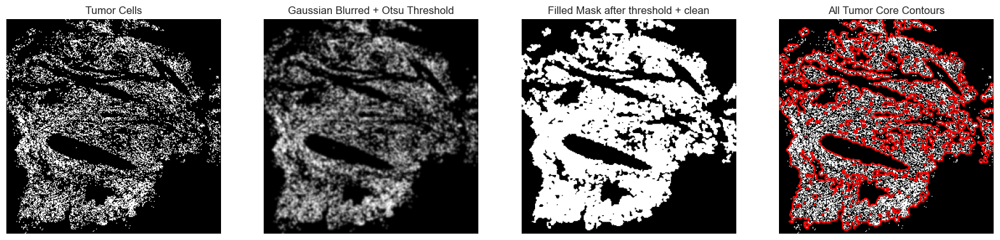

Not saving figure.
Processing experiment: NMC_15_ROI7


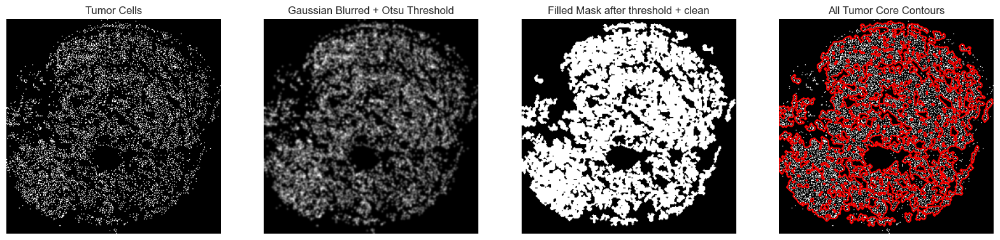

Not saving figure.
Processing experiment: NMC_1_ROI3


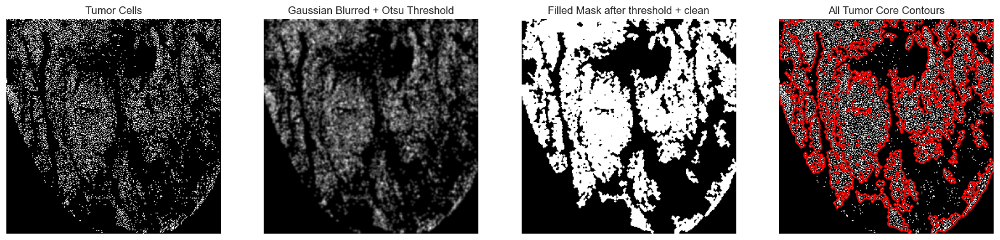

Not saving figure.
Processing experiment: NMC_16_ROI19


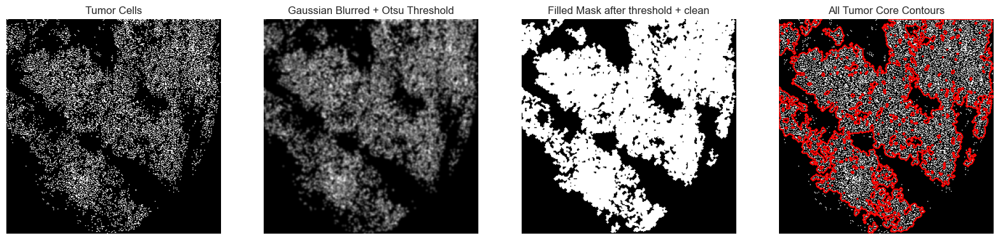

Not saving figure.
Processing experiment: NMC_2_ROI1


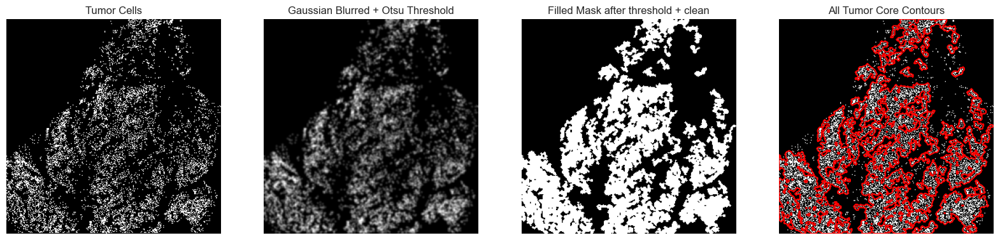

Not saving figure.
Processing experiment: NMC_14_ROI8


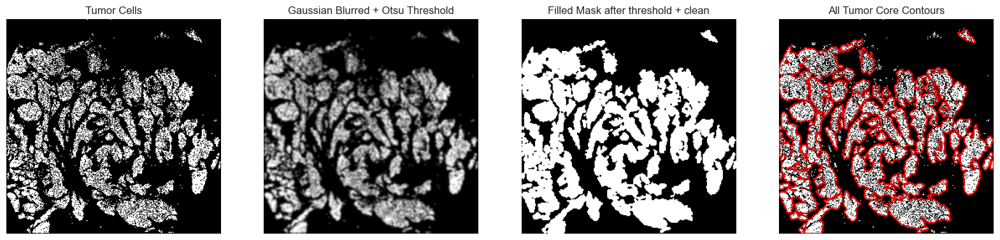

Not saving figure.
Processing experiment: NMC_16_ROI17


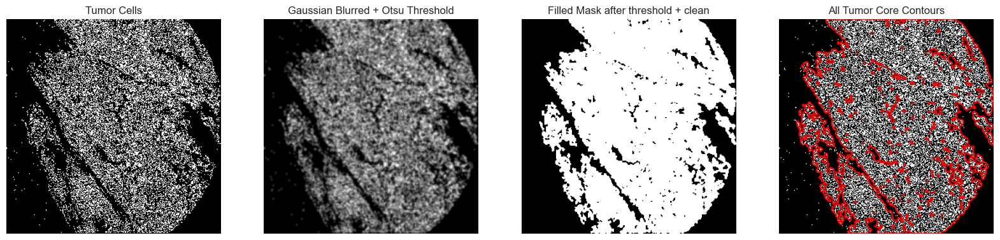

Not saving figure.
Processing experiment: NMC_5_ROI10


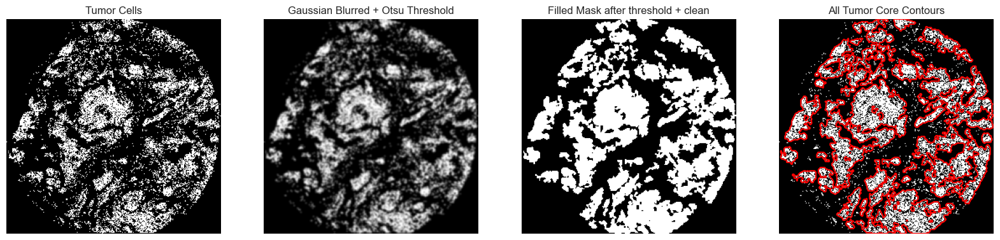

Not saving figure.
Processing experiment: NMC_8_ROI17


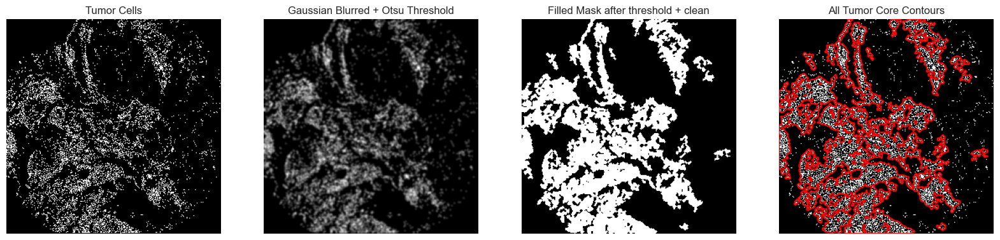

Not saving figure.
Processing experiment: NMC_5_ROI11


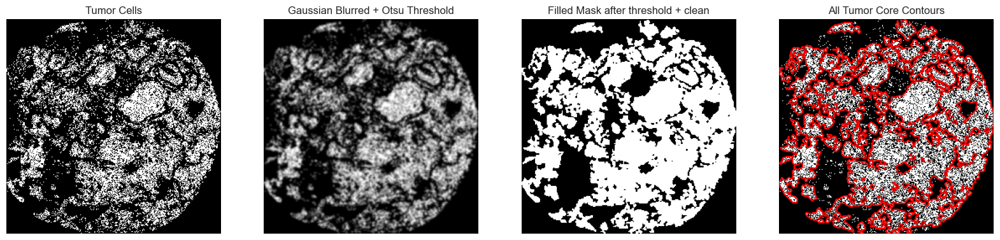

Not saving figure.
Processing experiment: NMC_13_ROI15


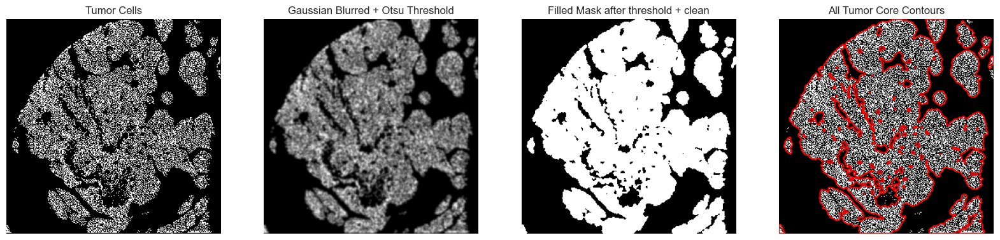

Not saving figure.
Processing experiment: NMC_1_ROI1


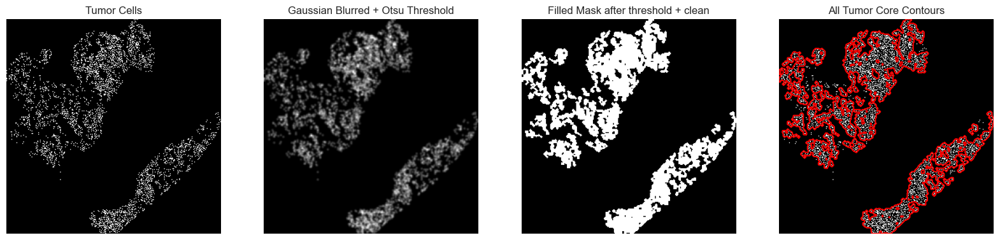

Not saving figure.
Processing experiment: NMC_9_ROI4


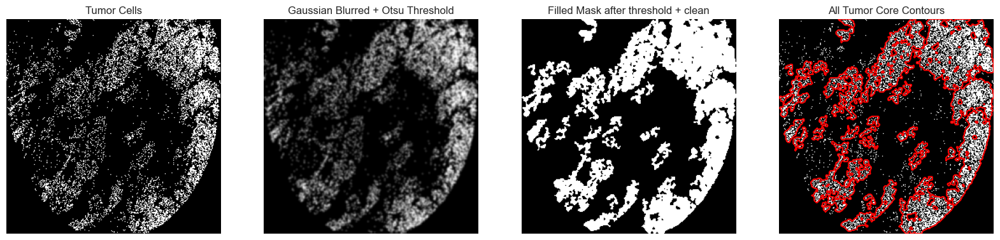

Not saving figure.
Processing experiment: NMC_21_ROI23


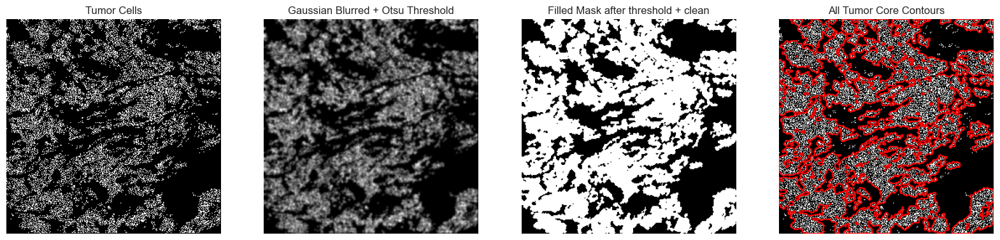

Not saving figure.
Processing experiment: NMC_9_ROI3


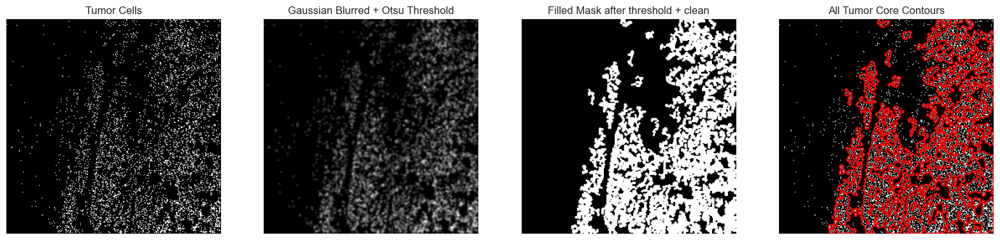

Not saving figure.
Processing experiment: NMC_4_ROI9


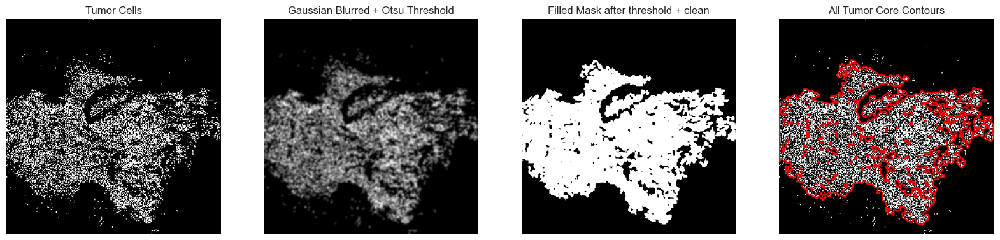

Not saving figure.
Processing experiment: NMC_13_ROI14


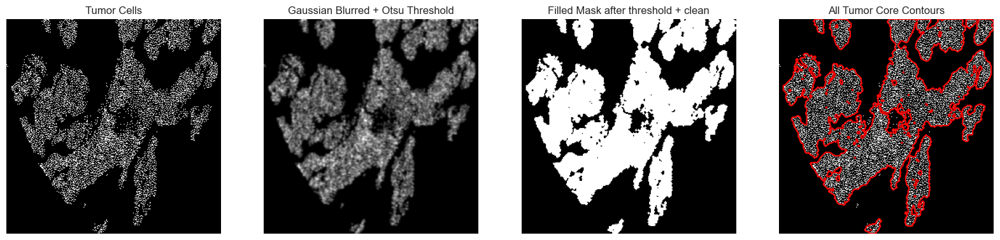

Not saving figure.
Processing experiment: NMC_7_ROI14


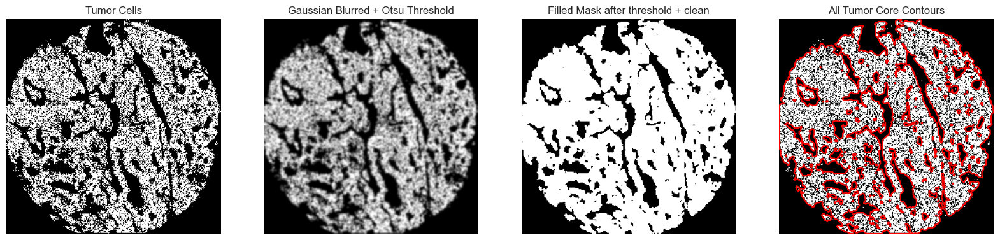

Not saving figure.
Processing experiment: NMC_7_ROI13


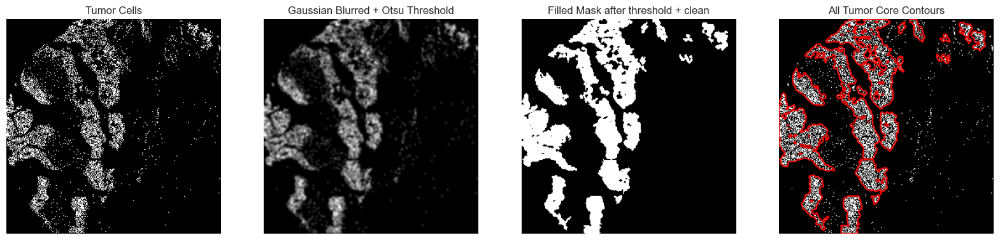

Not saving figure.


In [6]:
adata.obs['distance_to_tumor'] = np.nan
adata.obs['n_cores'] = np.nan
adata.obs['tumor_area'] = np.nan
for exp in adata.obs['patient_exp'].unique():
    print(f"Processing experiment: {exp}")
    # Subset adata for the current experiment
    adata_exp = adata[adata.obs['patient_exp'] == exp]
    polygons, distances, n_cores, tumor_area, on_contour_flags = extract_all_tumor_cores_otsu(adata_exp, plot=True, save=False, sigma=1, results_dir=results_dir)
    adata.obs.loc[adata_exp.obs.index, 'distance_to_tumor'] = distances
    adata.obs.loc[adata_exp.obs.index, 'n_cores'] = n_cores
    adata.obs.loc[adata_exp.obs.index, 'tumor_area'] = tumor_area
    adata.obs.loc[adata_exp.obs.index, 'tumor_edge'] = on_contour_flags

adata_exp.obs['distance_to_tumor'] = np.nan
adata_exp.obs['n_cores'] = np.nan
adata_unified.obs['tumor_area'] = np.nan
for exp in adata_unified.obs['patient_exp'].unique():
    print(f"Processing experiment: {exp}")
    # Subset adata for the current experiment
    adata_exp = adata_unified[adata_unified.obs['patient_exp'] == exp]
    polygons, distances, n_cores, tumor_area, on_contour_flags = extract_all_tumor_cores_otsu(adata_exp, plot=True, save=False, sigma=1, results_dir=results_dir)
    adata_unified.obs.loc[adata_exp.obs.index, 'distance_to_tumor'] = distances
    adata_unified.obs.loc[adata_exp.obs.index, 'n_cores'] = n_cores
    adata_unified.obs.loc[adata_exp.obs.index, 'tumor_area'] = tumor_area
    adata_unified.obs.loc[adata_exp.obs.index, 'tumor_edge'] = on_contour_flags


In [ ]:
conditions = [
    (adata.obs['distance_to_tumor'] == 0) & (adata.obs['tumor_edge'] == False),
    ((adata.obs['distance_to_tumor'] == 0) & (adata.obs['tumor_edge'] == True)) |
    ((adata.obs['distance_to_tumor'] > 0) & (adata.obs['distance_to_tumor'] <= 400)),
    (adata.obs['distance_to_tumor'] > 400)
]

choices = ['Core (0μm)', 'Edge (0-100μm)', 'Distal (100+μm)']

adata.obs['tumor_proximity'] = np.select(conditions, choices, default='Distal')

adata.obs['tumor_proximity'] = pd.Categorical(adata.obs['tumor_proximity'], categories=['Core (0μm)', 'Edge (0-100μm)', 'Distal (100+μm)'], ordered=True)